## Reading the data

In [1]:
import pandas as pd
import numpy as np
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE


df = pd.read_csv("../../corpus_sprint3_balanced_cleaned_all.csv", encoding="utf-8")
df = df.dropna()
print(df)
print(df.shape)

model = Doc2Vec.load("../../model_doc2vec_balanced_20epochs")

        Row No Date received                  Product  \
446       6874      09/09/16              Payday loan   
713      10840      08/07/15            Consumer Loan   
803      12248      08/07/16            Consumer Loan   
1153     17162      05/26/16            Consumer Loan   
1185     17642      11/05/15            Consumer Loan   
...        ...           ...                      ...   
126588  222826      09/21/16  Bank account or service   
126589  142174      03/05/16  Bank account or service   
126590   55888      01/23/17  Bank account or service   
126591  293505      09/27/16  Bank account or service   
126592  327087      09/28/15  Bank account or service   

                       Sub-product                                     Issue  \
446                           None  Charged fees or interest I didn't expect   
713                   Vehicle loan       Problems when you are unable to pay   
803                   Vehicle loan                Managing the loan or leas

In [2]:
df_concat = model.docvecs.vectors_docs

## One hot encoding and concatenating

In [3]:
vectors = model.docvecs.vectors_docs

In [4]:
one_hot = pd.Categorical(df['Issue'])
df_dummies = pd.get_dummies(one_hot)

v_df = pd.DataFrame(vectors)
df_concat = pd.concat([v_df, df_dummies], axis = 1)
print(df_concat.shape)

(58035, 141)


## Applying UMAP

In [5]:
import umap
data_reduced = umap.UMAP().fit_transform(df_concat)

C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\umap\spectral.py:4: NumbaDeprecationWarning: No direct replacement for 'numba.targets' available. Visit https://gitter.im/numba/numba-dev to request help. Thanks!
  import numba.targets


In [6]:
print(data_reduced.shape)

(58035, 2)


## Applying k-means

In [7]:
from sklearn.cluster import KMeans
from sklearn import metrics

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


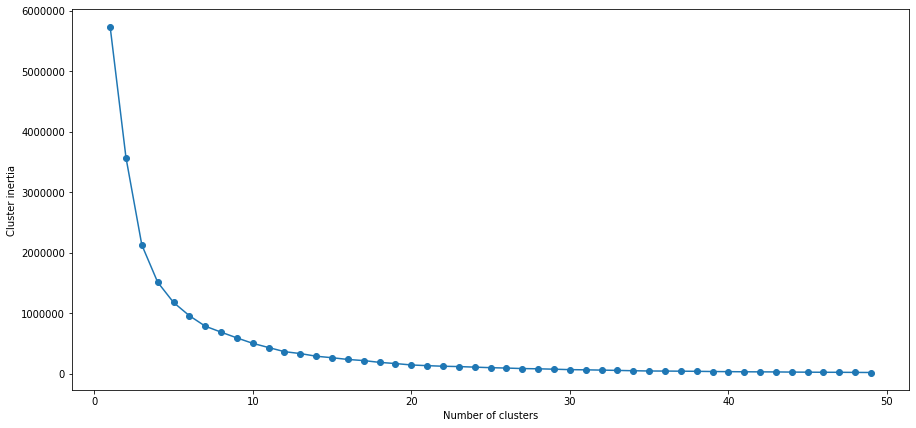

In [8]:
inertia = []
k_min=1
k_max=50
for i in range(k_min, k_max):
    print(i)
    km = KMeans(n_clusters=i,init='k-means++')
    km.fit(data_reduced)
    inertia.append(km.inertia_)
plt.rcParams['figure.figsize'] = [15,7]
plt.plot(range(k_min,k_max), inertia,marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Cluster inertia')
plt.show()

## Silhouette scores

For n_clusters = 4 The average silhouette_score is : 0.4247775
For n_clusters = 5 The average silhouette_score is : 0.41905552
For n_clusters = 6 The average silhouette_score is : 0.4520688
For n_clusters = 7 The average silhouette_score is : 0.46112463
For n_clusters = 8 The average silhouette_score is : 0.4849061
For n_clusters = 9 The average silhouette_score is : 0.48658094
For n_clusters = 10 The average silhouette_score is : 0.499032
For n_clusters = 11 The average silhouette_score is : 0.53120285
For n_clusters = 12 The average silhouette_score is : 0.5545918
For n_clusters = 13 The average silhouette_score is : 0.5792244
For n_clusters = 14 The average silhouette_score is : 0.5923208
For n_clusters = 15 The average silhouette_score is : 0.60814476
For n_clusters = 16 The average silhouette_score is : 0.61782324
For n_clusters = 17 The average silhouette_score is : 0.6320214
For n_clusters = 18 The average silhouette_score is : 0.6484911
For n_clusters = 19 The average silhouett

C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 24 The average silhouette_score is : 0.69659144


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 25 The average silhouette_score is : 0.71245277


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 26 The average silhouette_score is : 0.71265805


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 27 The average silhouette_score is : 0.7246313


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 28 The average silhouette_score is : 0.73683566


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 29 The average silhouette_score is : 0.74787706


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 30 The average silhouette_score is : 0.752646


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 31 The average silhouette_score is : 0.75649285


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 32 The average silhouette_score is : 0.76577705


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 33 The average silhouette_score is : 0.7712825


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 34 The average silhouette_score is : 0.7750637


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 35 The average silhouette_score is : 0.78118885


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 36 The average silhouette_score is : 0.7832357


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 37 The average silhouette_score is : 0.7386016


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 38 The average silhouette_score is : 0.8015693


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 39 The average silhouette_score is : 0.7545385


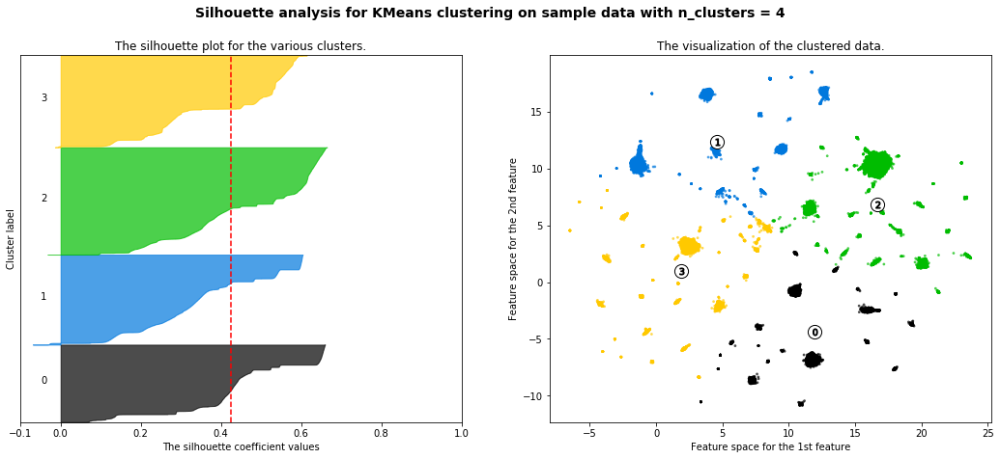

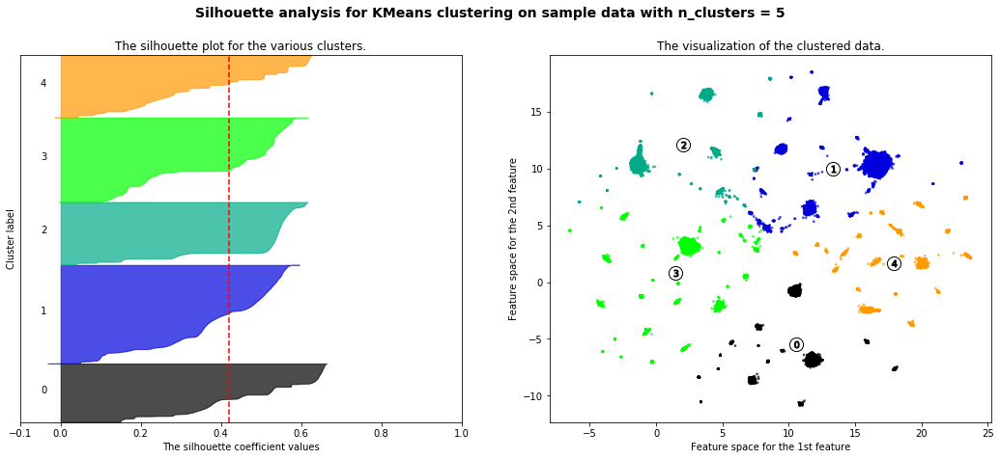

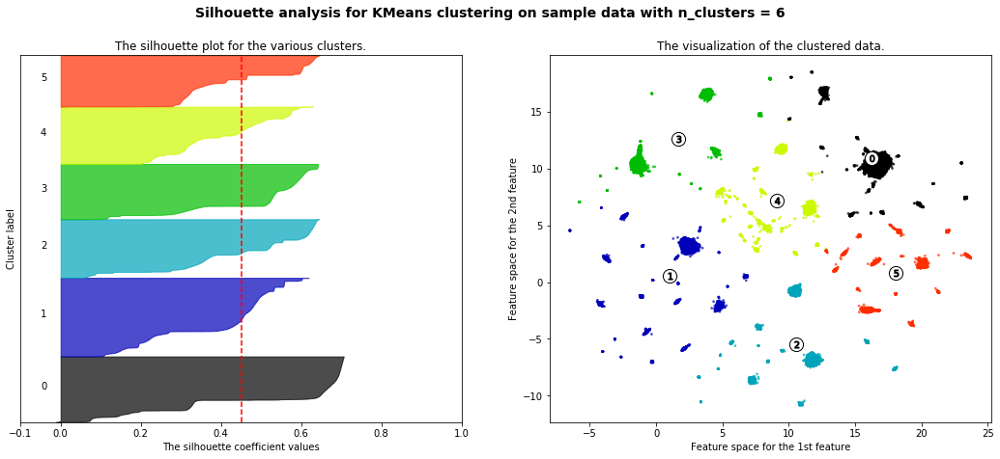

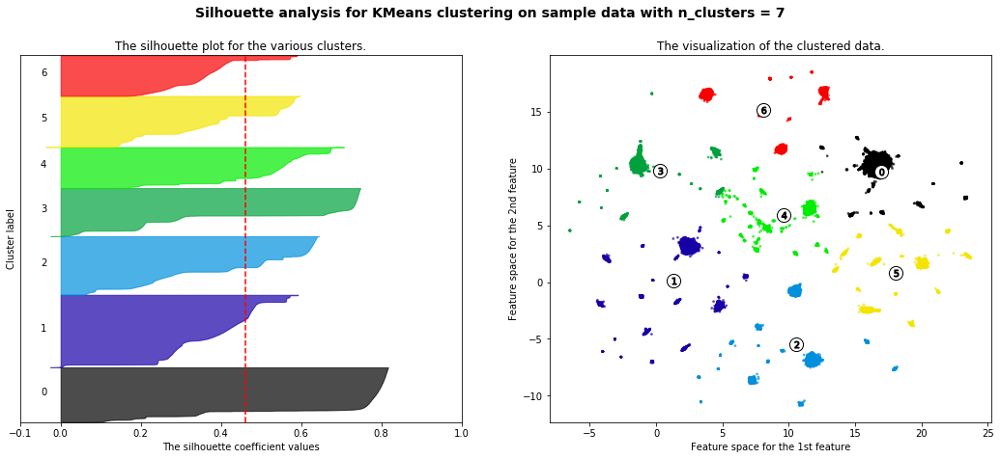

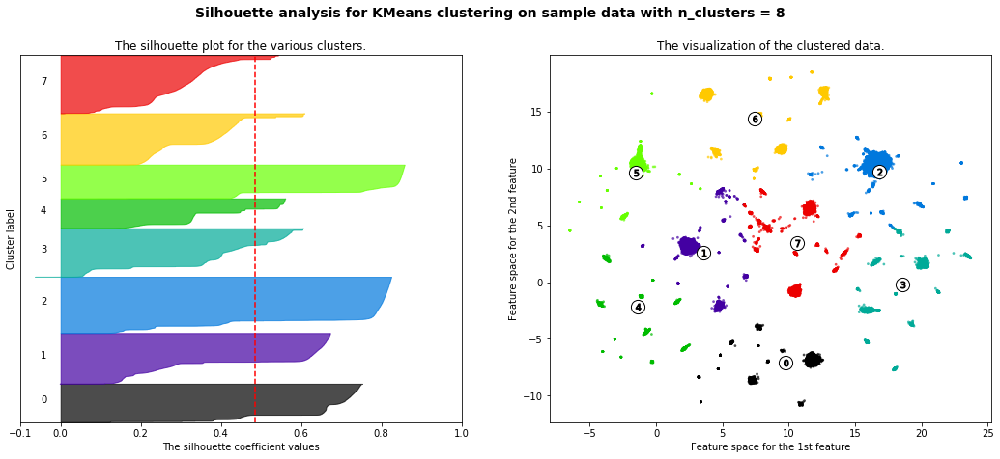

...

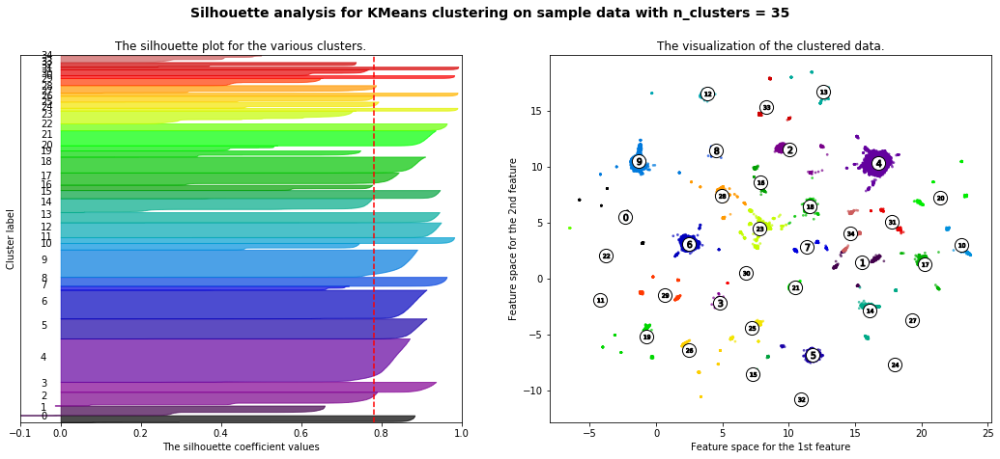

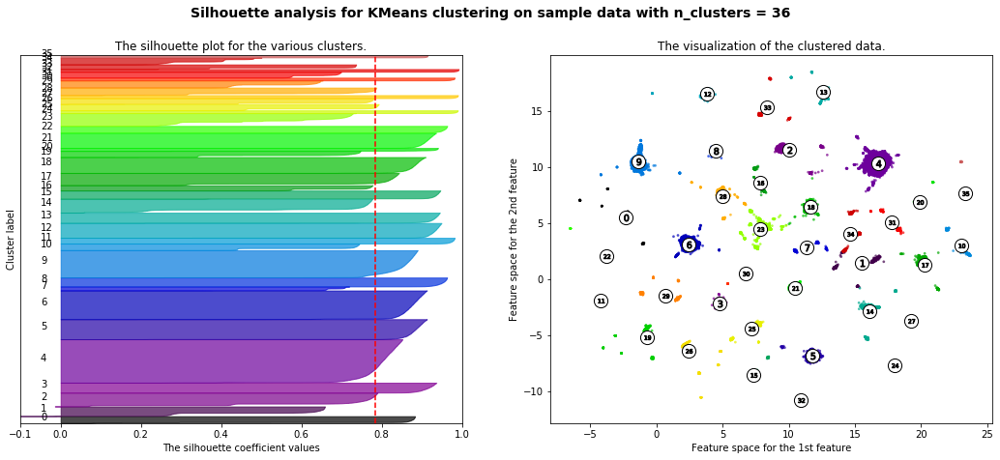

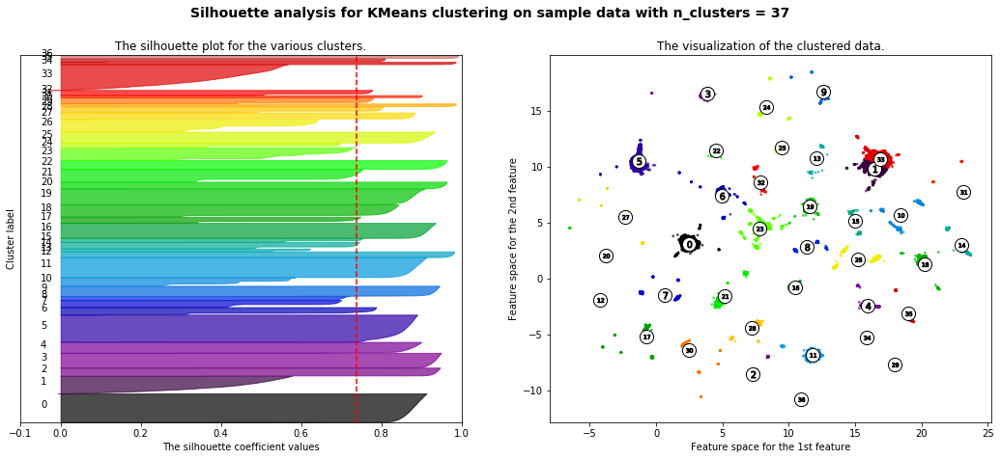

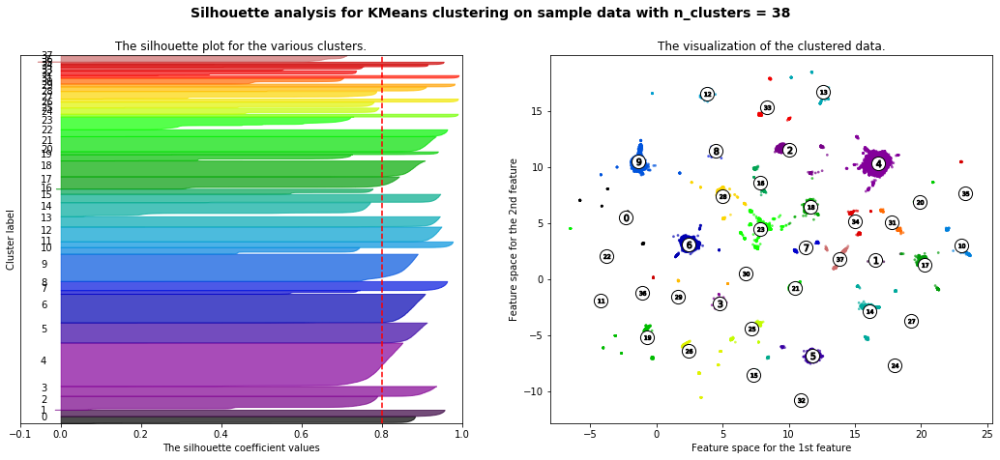

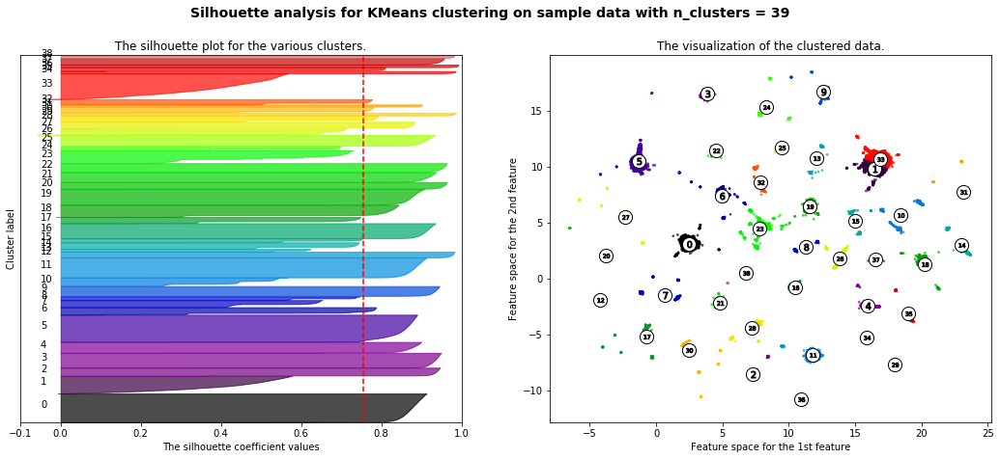

In [9]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

for n_clusters in range(4,40):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_reduced) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data_reduced)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data_reduced, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_reduced, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(data_reduced[:, 0], data_reduced[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

## Analyzing with narrative

In [13]:
number_clusters = 38
km = KMeans(n_clusters=number_clusters,init='k-means++')
indexes = km.fit_predict(data_reduced)
centroids = km.cluster_centers_

df_index = pd.DataFrame(indexes)

indici = []
for i in range(0,len(indexes)):
    indici.append(i)
df1 = df_index.set_index(pd.Index(indici))
df2 = df.set_index(pd.Index(indici))
df_result = pd.concat([df1,df2], axis = 1)
print(df_result)

        0  Row No Date received                  Product  \
0      25    6874      09/09/16              Payday loan   
1       6   10840      08/07/15            Consumer Loan   
2       0   12248      08/07/16            Consumer Loan   
3       0   17162      05/26/16            Consumer Loan   
4       0   17642      11/05/15            Consumer Loan   
...    ..     ...           ...                      ...   
58030  27  222826      09/21/16  Bank account or service   
58031  22  142174      03/05/16  Bank account or service   
58032  27   55888      01/23/17  Bank account or service   
58033  13  293505      09/27/16  Bank account or service   
58034  27  327087      09/28/15  Bank account or service   

                      Sub-product                                     Issue  \
0                            None  Charged fees or interest I didn't expect   
1                    Vehicle loan       Problems when you are unable to pay   
2                    Vehicle loan         

Cluster number: 0
i entered into a lease agreement with nissan motors acceptance corp on the first payment on the lease was made on their website all of my monthly payments are made online on i sat at my kitchen table and paid bills the nissan payment was never taken from my account i did not realize this had occurred until i logged into my account in to make the payment they indicated that there were attempts to contact me however i never received a voice mail from anyone at nissan they are unwilling to work with me to clear the late pay from my credit report this is nothing more than a misunderstanding and i believe that the consumer should be given the benefit of the doubt i am attaching the email sent to one of the managers in the collections area the email was sent to both his personal and corporate email address when i spoke with today she again indicates the payment has not been made i made the payment on also attached is the letter that i am sending to their consumer affairs de

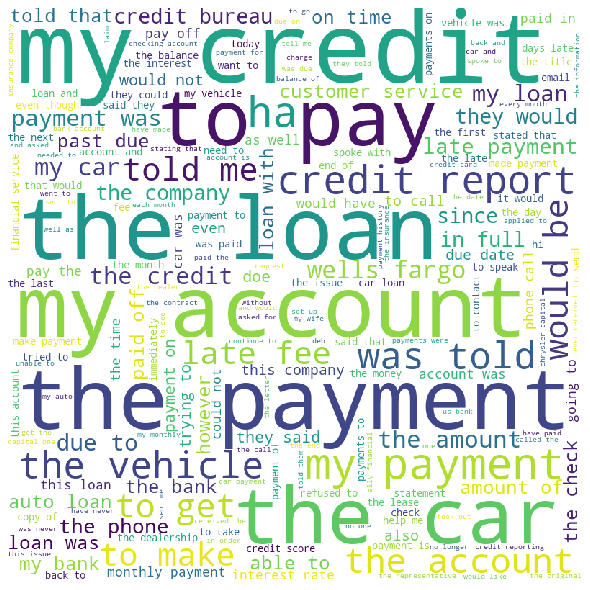

Cluster number: 1
this is not a request for you to put any kind of freeze on my credit report or to put any kind of fraud alert i am challenging your listing of ** collection agency** account number as it does not meet the fcra guidelines first off i have contacted this company and they are telling me that names is on the original contract not mine so how can you lie and say that you have verified this account when clearly you have not you are breaking the law as i have requested that per section of the fcra that you furnish me with the original source document that you must have on file to support your right to report information against me you have not done this so you are now in violation of this specific section of the fcra you are hereby notified of my intention to sue transunion if this is not removed from my credit report immediately no more games or wasting of time you have days by law to provide me the original contract showing my name and signature or remove this 

i am unsur

reporting account status that is old coastat federal credit union is still reporting and days late from years ago and account is reporting days late almost years ago from what i am told this should be showing the previous months max not a late payment i made years ago reporting lates from and years ago also the following fraudulent inquiries made by my ex wife are still showing card fingerhut all these inquiries were initiated without my permission all the accounts look ok that i see thus far i just want the above corrected and removed 

i had the mortgage co make a big mistake on my mortgage so they sent a letter out to all agencies to remove any negative marks for and as is shows on both equifax and trans union this went out in several months ago and i requested a new one today so i am attaching both my letter and a copy to show the lates they are reporting in error 

fha loan short sale fha requires that i am late on my mortgage payment to be considered for a short sale due to medic

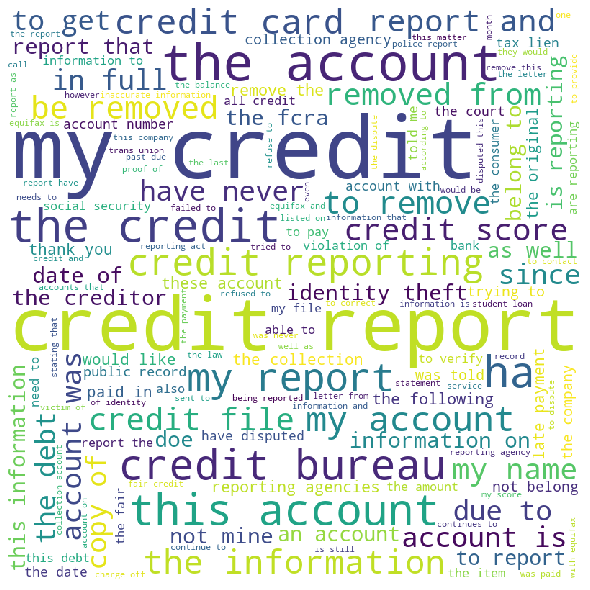

Cluster number: 2
i have recently graduated and surpassed the six month post graduation deferment status i intend on continuing my education but until then i planned on paying on my student loans when i had initially called and navient and and navient again due to their incredibly confusing split of my loans after i had taken them out they had given me one specific payment of which was reasonable when the bills actually arrived in the mail they were quadruple what i was told on the phone a few months prior without having been employed in my field yet i was able to pay the original stated payment but can not afford what they are claiming i must pay monthly now every time i call i reach a different person who is insistent on handling my call rather than trying to transfer my call to whom i had spoke to the last time this leads to ever changing advice and totals every time i call they give me a different amount date and information i am so overwhelmed because i feel as though and navient 

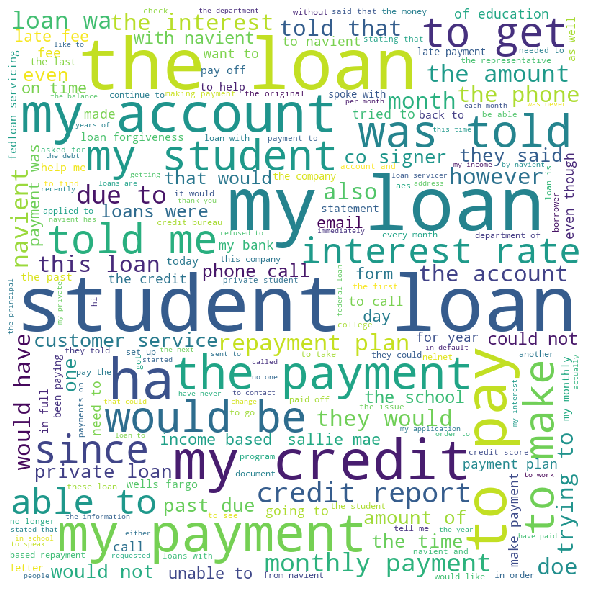

Cluster number: 3
Number of entries: 825


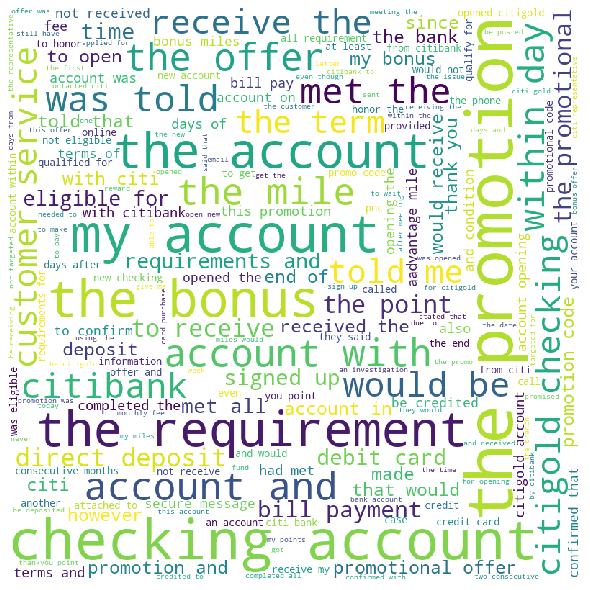

Cluster number: 4
procollect took on an alleged debt from for a charge to me that was never even sent to me by and procollect posted this alleged debt against my credit without ever trying to collect it from me beforehand in order to get my credit score back to normal i even paid procollect this over a month ago and they still have it lodged against my credit score i ve called them twice given them the check info they cashed it on and they continued to play ignorant about it all what can i do now 

i was a cosigner for the rent of this apartment and my ex wife was living there and she was the owner of the contract and i was checking my credit and appears under my name only it says individual account and this account is not mine

this company has not provided verification or validation of this debt this does not belong to me

 billed at a higher rate than quoted during the sales calls month after month telling me it would be fixed giving me one reference after another year price lock wa

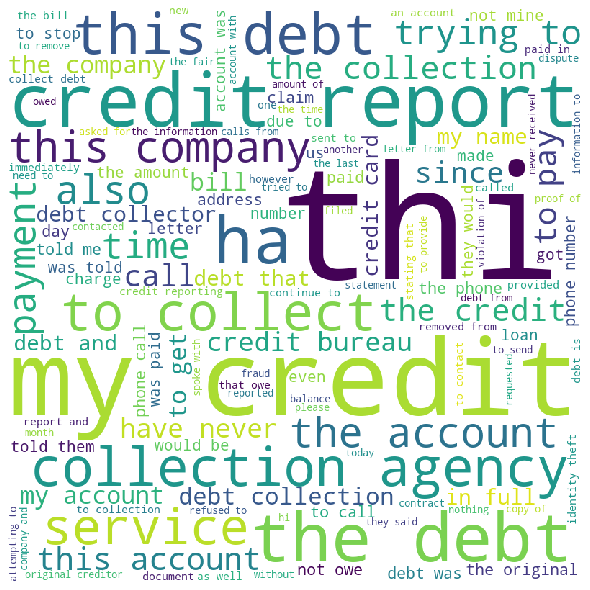

Cluster number: 5
part of letter written to amex the whole letter would n t fit i am writing about my account ending in my issue has been going well over a year now and i do n t understand why no one will respond to me anytime i call and they say they will help me from amex i have called and called and called in trying to resolve this matter i even made a call today and of course got the run around again and my issue is still not resolved on top of this i had an outstanding credit score before all this headache happened my score was over with the major reporting services and now it has dropped very low i had an open line of credit with a few companies like ect and they all dropped my line of credit because of a high revolving balance or frequent late payments and a drop to my credit score rating if i were needing to buy a house right now i d be screwed all because of this i have always kept outstanding credit and i do not have any credit card bills i only owe on my house and car i pay 

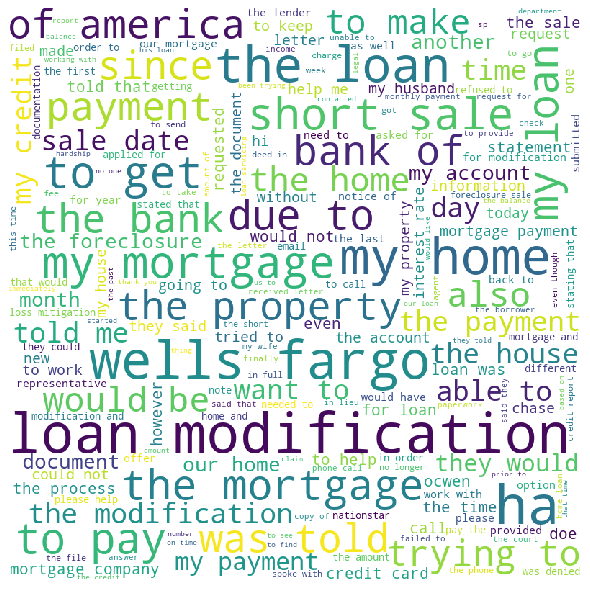

Cluster number: 6
i called in and spoke with a respresentative by phone and he was not able to work out arrangements with me he mispronunced my name i advised him i was considering bankruptcy but i wanted to work out arrangements then told me he will set up arrangements after i spoke with his supervisor for then he came back on the phone asked for my phone number and email and i advised that i would not be able to provide that information he can only notify by mail only he refused to take my payment arrangement after i told him i would report the business to cfpb i will be looking to take legal action based on this call 

i had a auto loan through that went into default they sold the debt to atlas financial atlas filed for a judgement and got it approved when filing a auto loan judgement the law is they have to file in the county you reside in they did not do this im in county the judgement is in county where ive never lived when they got the judgement they filed to the credit beurros 

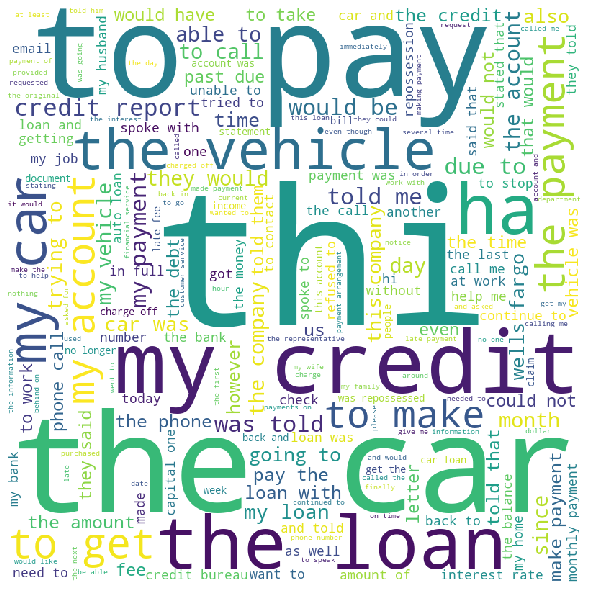

Cluster number: 7
my mortgage is with i just got it months ago and they used an assumption to set my escrow based on what they thought my property taxes would be well they thought they would be a year roughly and they are actually big difference i have emailed and called times over the last months to get a refund for overpayment and get my escrow payment adjusted as i should not have to be overpaying it and them keeping my money i keep getting told it will be handled and no one ever handles it i call back and they submit a new request and still nothing i am yet to get an email or a call back or a letter about adjusting my escrow payment and getting me a refund for the over payment i have made 

my bank via web pay bill paid my mortgage to wells fargo on for over a year wells fargo had received payments via this method and applied the funds to my mortgage this time wells fargo did not apply the funds to my mortgage but instead somehow misplaced and lost the payment it took nearly weeks 

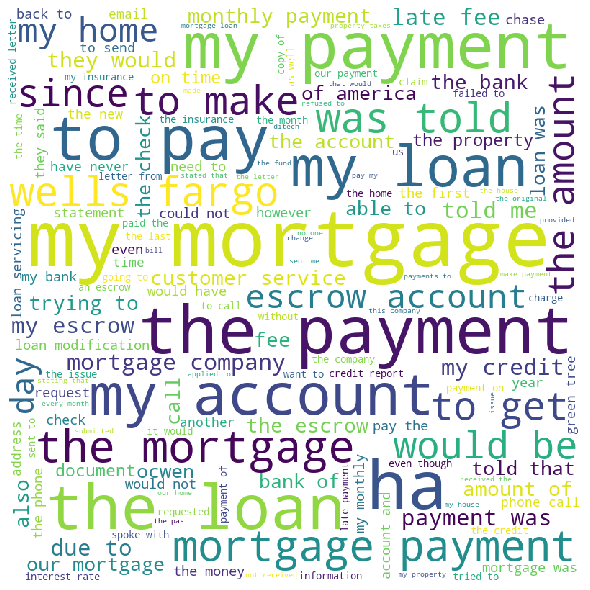

Cluster number: 8
 a manager at sofi told me on that my debt consolidation loan could not be cleared to close after i submitted the requested documentation to the company two weeks earlier i was originally approved for by sofi and was trying to consolidated of credit cards sofi requested my tax returns since i am self employed for and which i provided then they requested all of the schedules that i did not have i called to ask which schedules for personal or business returns and the lady i spoke to said that since i received paystubs from my business that i could just submit those for approval i submitted my last paystubs by uploading them to sofi and i called back to make sure they were received now a new rep said that i still needed to submit the schedules for the tax returns even after i had been told that my paystubs would be fine i called sofi today and another rep said that they were still looking for schedules i then spoke to her manager and he refused to speak to my accountant 

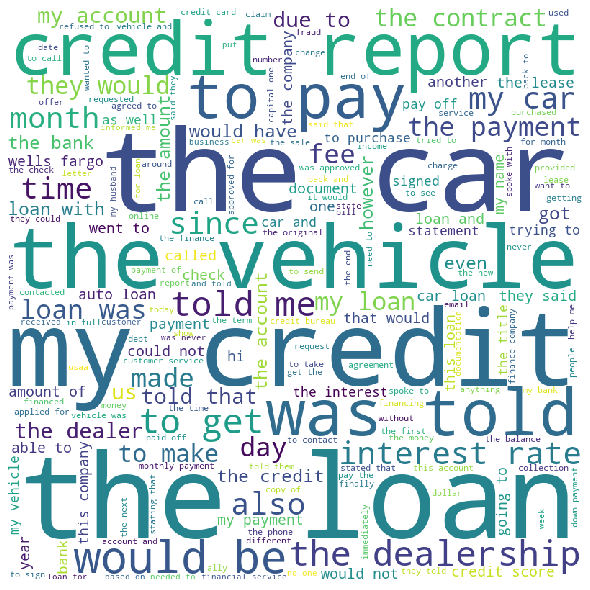

Cluster number: 9
my girlfriend and i signed up for checking accounts with suntrust on joint and individual we were asked about overdraft protection at first we said no but the representative insisted we get it stating that we did not want our child stranded at the gas pump unable to purchase gas to get home we reluctantly signed up for it understanding it was a service for a small fee recently we utilized the service to avoid a late rent payment much to our surprise we received overdraft charges instead of the one we were expecting in contacting the bank we were told they organize the transactions by size the largest first because it is likely to be the most important after several minutes of protesting with the representative we were called irresponsible after going through our records they have been reordering our transactions since opening our accounts to maximize fees after visiting a local branch we got the same song and dance about the reason they reorder our transactions our ca

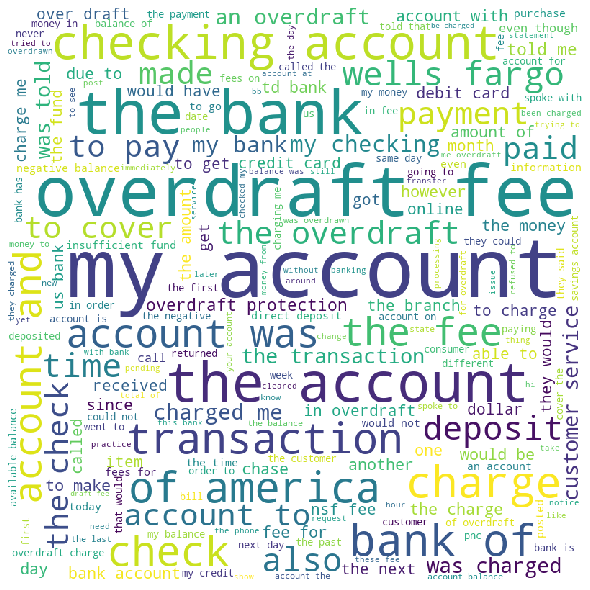

Cluster number: 10
having multiple credit cards i gave discover the wrong passcode to my account they immediately transferred me to the fraud department without my knowledge all of a sudden it went from courteous service to someone who was brief and dismissive the personal questions they asked about my life are pulled from public records and they were not accurate so they continued to lock my account despite them having incorrect information i was finally able to activate my card but i felt such a difference in service when transferred to the fraud department while discover s goal may be to put the customer first they clearly do not treat all customers equally furthermore their disinvestment in technology systems which could speed up the credit card activation process is eye opening they could not verify me by sending a passcode to my phone or email 

Number of entries: 908


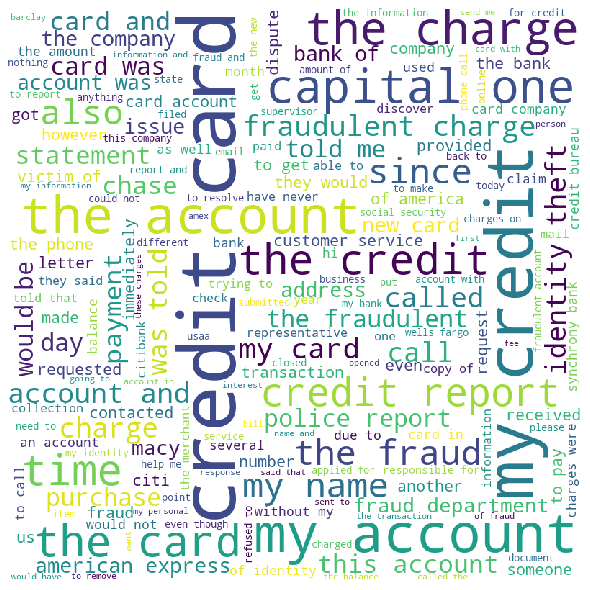

Cluster number: 11
Number of entries: 1015


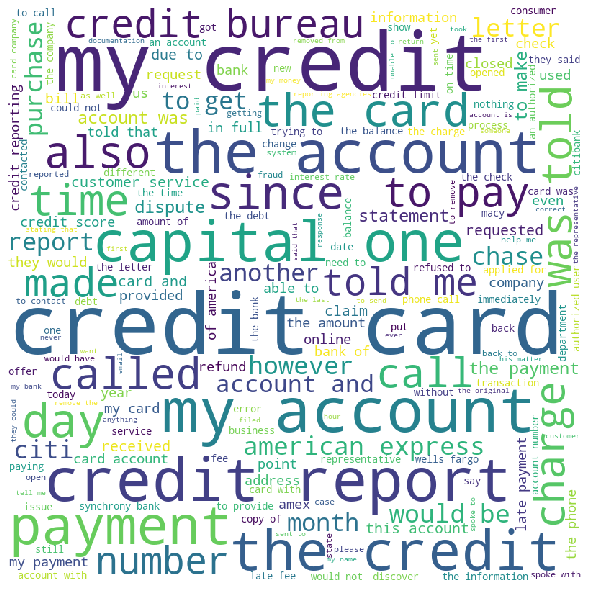

Cluster number: 12
i had a amazon chase visa credit card for purchases i made on i changed banks and set up my bill pay on a new system amazon said i was late and charged me a late fee i checked with my bill pay and it showed the payment had been received on the same day it was due and the same day i was charged a late fee amazon did credit back that late fee the next month i was one day late i had informed the credit card my newness to my new bill pay but irregardless i was charged a late fee because this card had no grace period what so ever and did not take into account my high credit rating or good customer history i decided to pay off the credit card and stop using it so i paid the credit card off before it was due that next month with a balance i had an item to return and that left a credit on my account i requested that credit so that the account would be and i planned on putting the card away then i get a notice that there is another balance on the credit card that it is intere

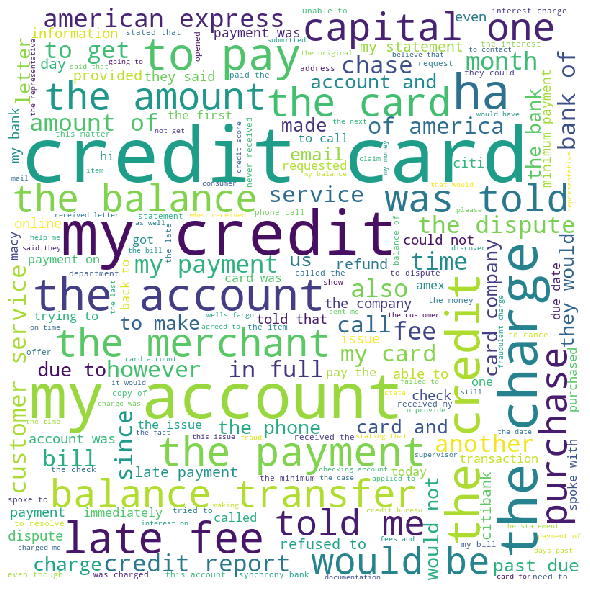

Cluster number: 13
dear scottrade cfpb officials and the concerned public i am writing to follow up on the unproductive behavior of scottrade and their affiliates collectively known as scottrade specifically in scottrade allowed a custodial account held by me and my son to be hacked likely in the databreach scottrade had that led to customers having their personal information exposed myself and my son worked diligently in attempts to resolve the situation and worked with numerous other financial institutions involved in the fraud and irs have all agreed that the actions that occurred were the result of identity theft and fraud however scottrade refuses to acknowledge these events as fraud for fear of exposing that their security systems are very poor to warn the general public about the actions of scottrade i would invite current and potential customers to google scottrade s customer reviews and i assure you will not want to do business with this type of company for the purposes of res

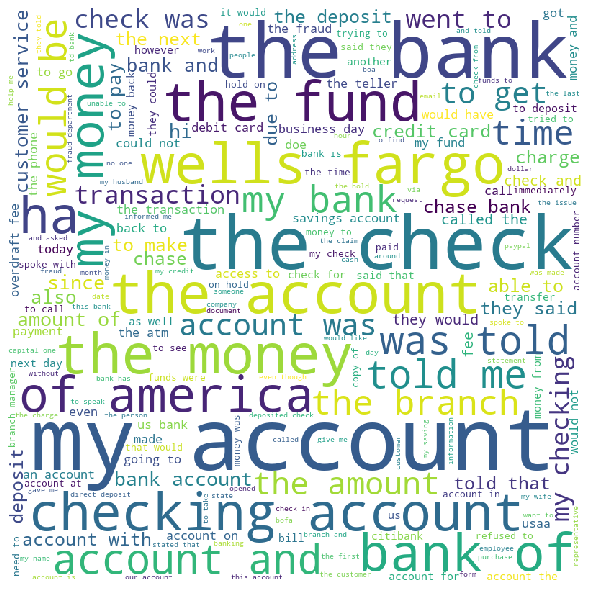

Cluster number: 14
Number of entries: 1628


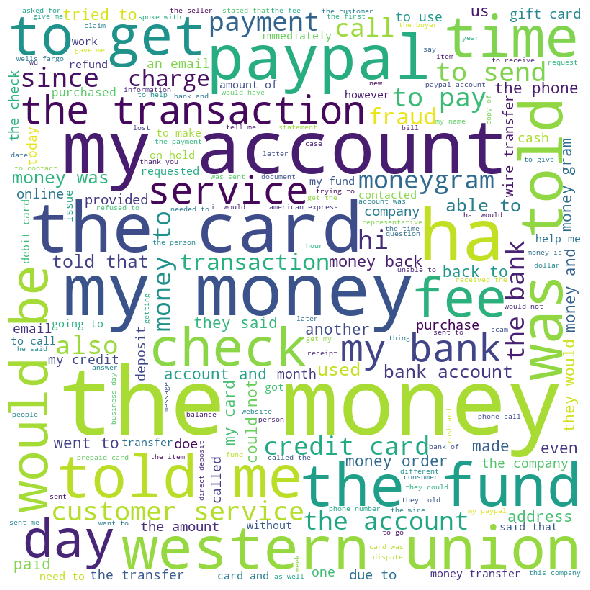

Cluster number: 15
 i noticed a public record account of a property tax lien on my credit report it was a tax lien from county superior court in georgia for the amount of it was listed with the transunion company this is the only credit reporting agency that had this listed this tax lien was not mine i have never been to county never lived there never owned property there over the past year i have filed disputes trying to have this removed i have asked for verification of their information they could not provide this i have asked for their method of verification they did not supply that to me i have gave them a name and phone from the county clerk of courts office of someone they could talk to about this they did not call them i have sent them a copy of the index listing of tax liens in county for the date listed on the lien this came directly from the clerk s office where tax liens are filed it was proof that it was not there they said i was being frivilous i did one of the disputes o

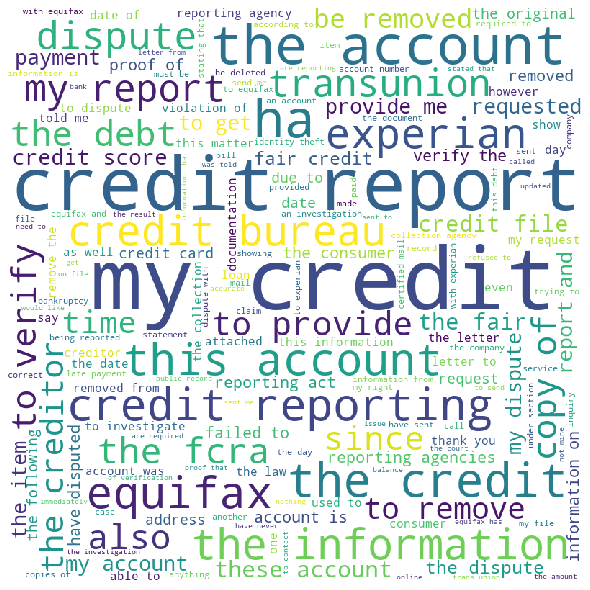

Cluster number: 16
a year loan at simple interest in and ongoing we have made in principal only payments as allowed by our original contract and interest has been taken out of those payments there are other anomalies in the account history that are different from the actuarial table we have not been given an explanation that is much more than making the numbers say what they want we have been trying to pay this off since in person at pnc bank fl and phone calls many not answered or returned since then the payoff amount is always about high by my arithmetic pnc bank and we have been going around on this since late it is my opinion they pnc bank is stealing from us and with the continuous avoidance and runaround a day in interest since mostly they pnc bank continues to not respond 

i called on about m y citi presti ge card i called because i was charged the annual fee and i wanted to see if i could get my card changed to one without an annual fee i called and found out the card can be c

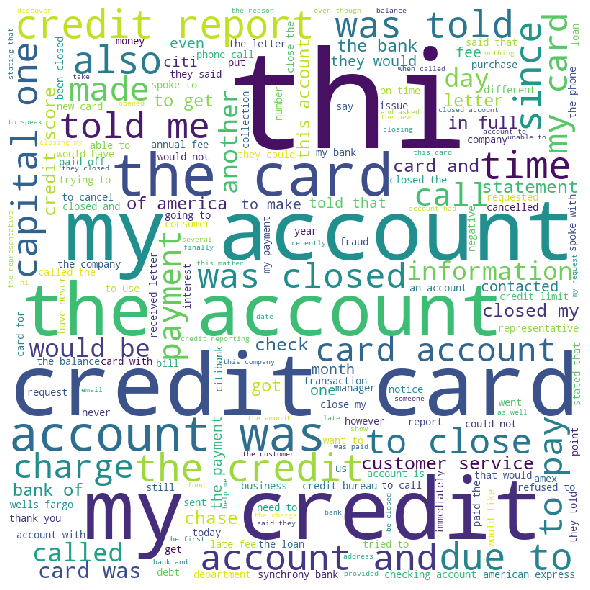

Cluster number: 17
on u s bank put through a charge for even though i did not have a positive balance at the time of this charge the charge was submitted using my debit card by car rental it has been established by everyone at the bank that we contacted that we indeed opted out of any and all over draft possibilities once i discovered the error i contacted the bank and spoke to several people including supposed supervisors in customer care i will include their name and contact info as hard copy attachments the explanations were nonsensical the included probably happened etc but not hard evidence or any evidence at all the last supervisor actually suggested that an authorization was obtained on for by although there was never a charge for that amount per my statement therefore according to they were able to increase that authorization to on the of a full days later with no further authorizations ever taken place when i told him that was a preposterous scenario and that s not how the aut

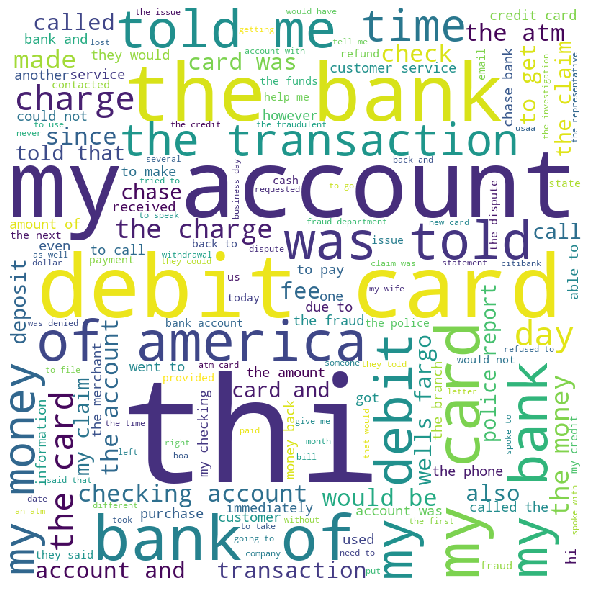

Cluster number: 18
Number of entries: 412


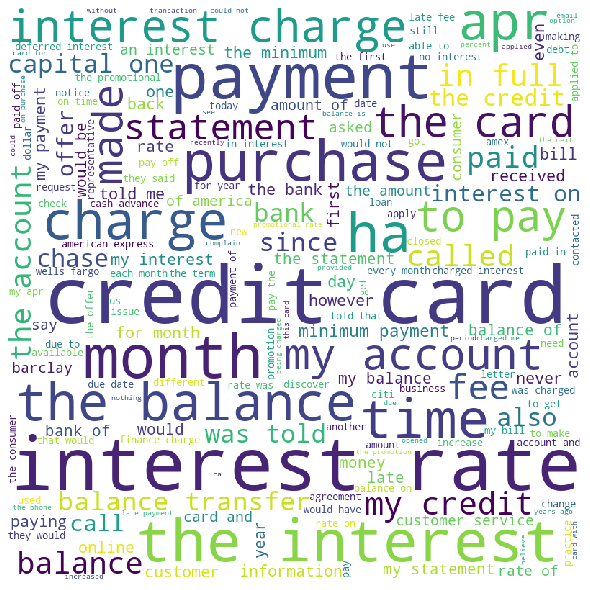

Cluster number: 19
this is a follow up complaint to several other cfpb complaints on this same issue yesterday i spent over an hour on the phone with b of a during my work day this was at least the third call to them to fix the same problem i also spent over an hour with them on the phone on sunday my weekend the short problem here is my statement posted on i scheduled a payment to occur it did but they applied it to the prior month saying because i made the request on the that is when they applied it i am not rehashing any of this refer back to the prior complaint while i filed a cfpb complaint yesterday on this and a number of times before i also called b of a and hashed it out and finally got a rep who understood said she would fix it she said she saw the prior rep errors and that instead of a month behind i was a month ahead she said she would submit a trouble ticket and fix it today i looked online stilk showin late and today their home office retention called me in response to my

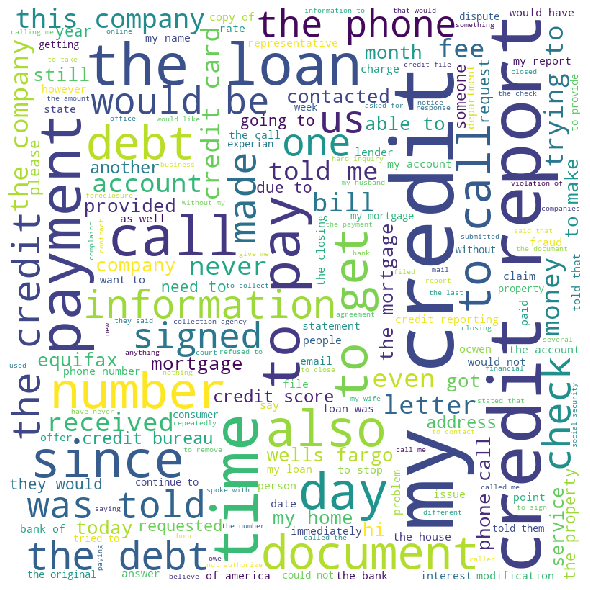

Cluster number: 20
southwest credit offered a settlement option which was fulfilled but never informed that the account was settled in full i spoke with sw and they offered me a settlement of which was spilt into payments of first payment was taken out of my account on and the other was taken the supervisor i spoke with advised that i would get a paid in full letter after the second payment an agent called me a couple days after the second and final payment and stated that i still owed a balance of i then explained to that agent that i had already settled in full he said the account was n t closed correctly and he would close the account correctly and that i would get a paid in full letter i never got a paid in full letter but i id see that it was credit reported as and zero balance then on october i got a call from a different collection agency saying i owe a balance of and i never settled in full i called southwest credit back and they said for the third time that they are sending a 

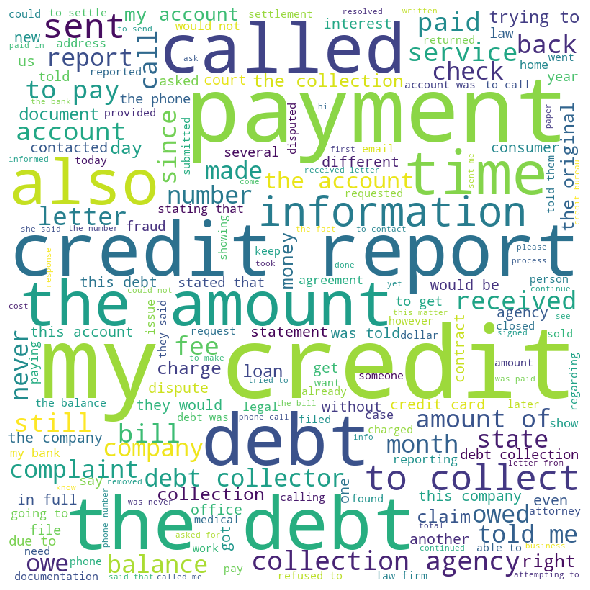

Cluster number: 21
i have had a student loan for a number of years in the last few years i have had to take care of my child on my own and am homeless living with family as of i have been laid off from my job i have tried to request deferments from navient and have either not been answered the case with the last applications or they tell me ok you can have it only to send me a massive bill the next month they now tell me that my minimum payment is over and that i owe over and i never borrowed more than i never had these problems when had my account i am not trying to get out of paying my debt i simply need help at this time i attended college as well as the university florida

Number of entries: 1311


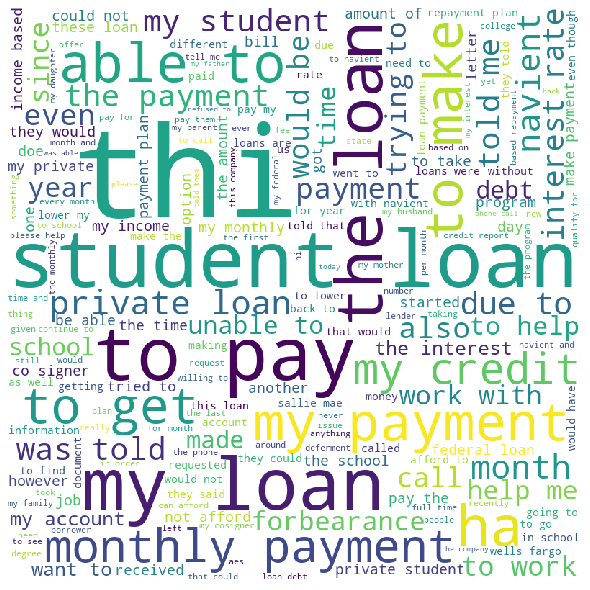

Cluster number: 22
Number of entries: 1085


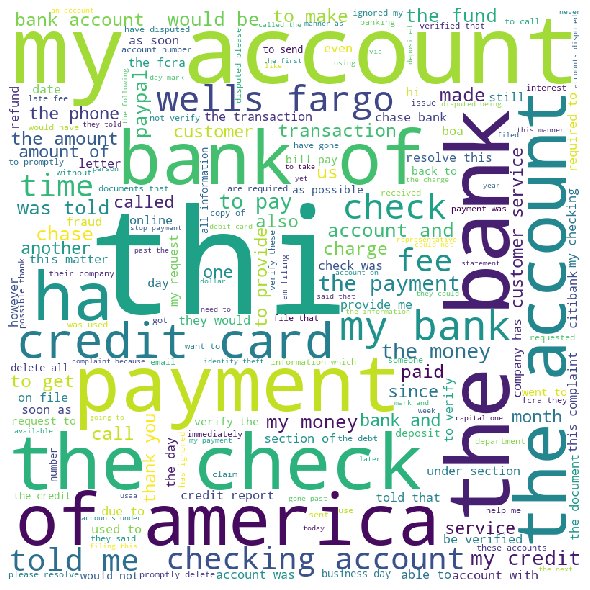

Cluster number: 23
Number of entries: 787


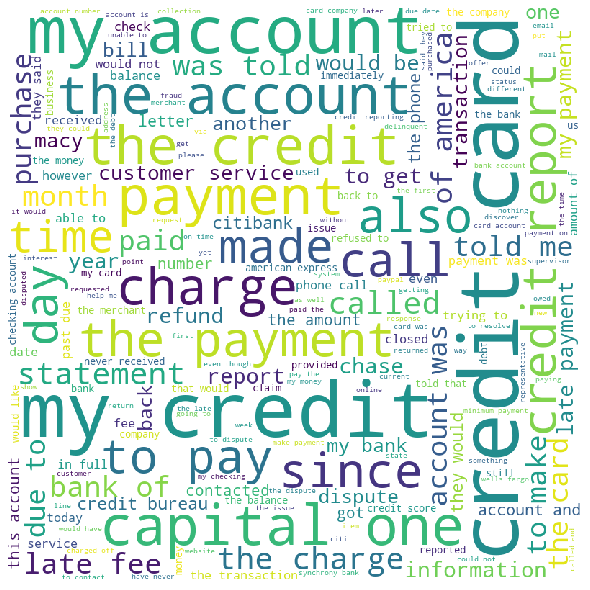

Cluster number: 24
the credit bureaus are giving out wrong information on me and refuse to give me my credit report i am being discriminated by the credit bureaus and they are giving the person who is using my information the correct information and giving the people that i apply too the wrong information 

Number of entries: 975


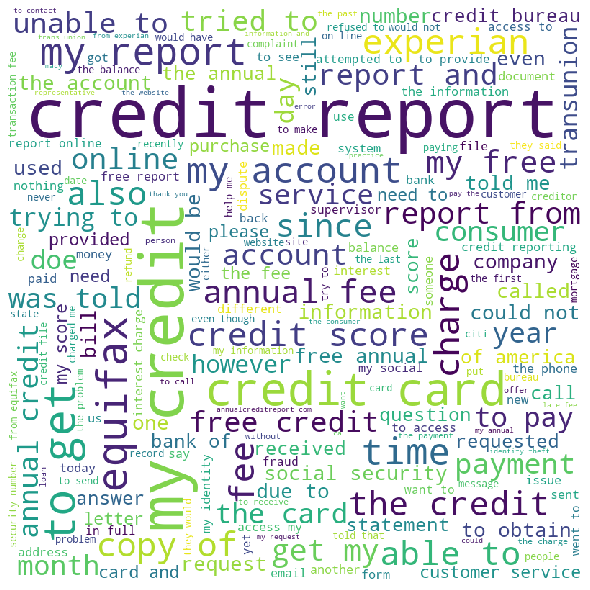

Cluster number: 25
this company does not show up in the california business oversight as having the legal right to charge a usury interest rate of over to persons in the state of california or elsewhere i received an undated letter from them on claiming to turn this illegal account over to a collection agency if i did not pay this illegal account 

i am inquiring about a payday loan i had with ace cash express between i was informed that if i took out a loan within the timeframe noted above that i would be compensated due to the settlement that you all reached i want to make a claim because i did have a payday loan with ace at that time can not recall exact date i do not have the loan papers anymore i visited the ace cash express on in co for dollars and was banking with bank at the time when and how will i be compensated thanks 

i am being charged over in fees etc for only making a or dollar payment i have made it clear that i can not pay a full amount of close to and i need to make 

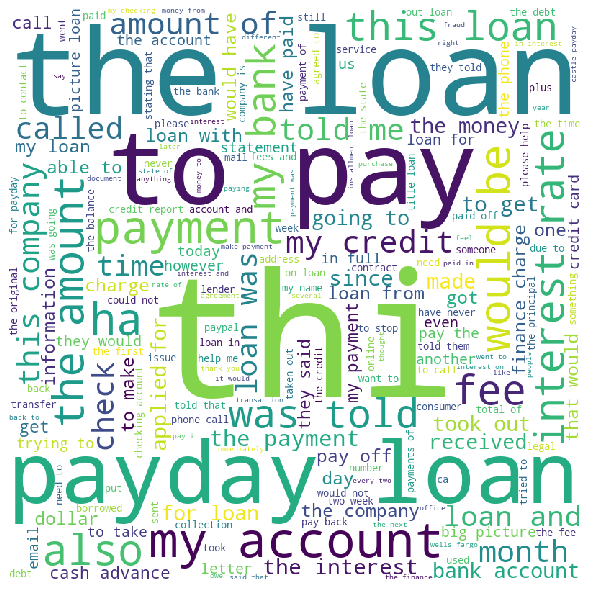

Cluster number: 26
i received a letter of foreclosure in from asc wells fargo the reason i was in default is because my husband and i were laid off due to the recession of the country i immediately apply for a loan modification but was denied then we failed for a bankruptcy in but was dismissed we have try numerous ways to get this loan modification for the pass six years and no progress has been made i am frustrated to hear the same story about it going through a process for almost years and i still having received help from wells fargo bank 

concerning my note mortgage loan with wells fargo home mortgage upon careful examination of my loan documents i ve found many and various violations of the documents and regulations relating to the loan and loan application as well as the commission of appraisal fraud i would appreciate your help in this matter 

Number of entries: 1119


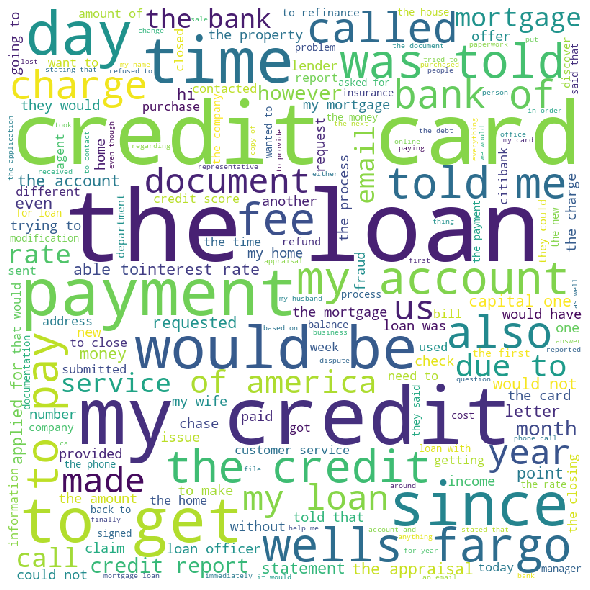

Cluster number: 27
this is wi we have cd s representing clients that have irrevocable funeral trust agreements with us that chase bank wi has sent the funds to the wi unclaimed property we have made an effort with the unclaimed property people and they say chase bank has to file paper work to recover the funds back to the bank the people at chase bank are unwilling to cooperate with us is there anyway you can encourage them to cooperate this is not fair to the families that have entrusted chase bank to safeguard their funds for their funeral services this whole issue has happened with our funeral home and chase bank in the past this is the first time they refuse to assist they evidently no longer wish to have irrevocable funeral trusts 

i went to a wells fargo branch and added my fiance to my pma checking account turns out bank employee added him to all my accounts and he received debit cards in the mail which we did not request turns out the bank employee not only opened accounts in 

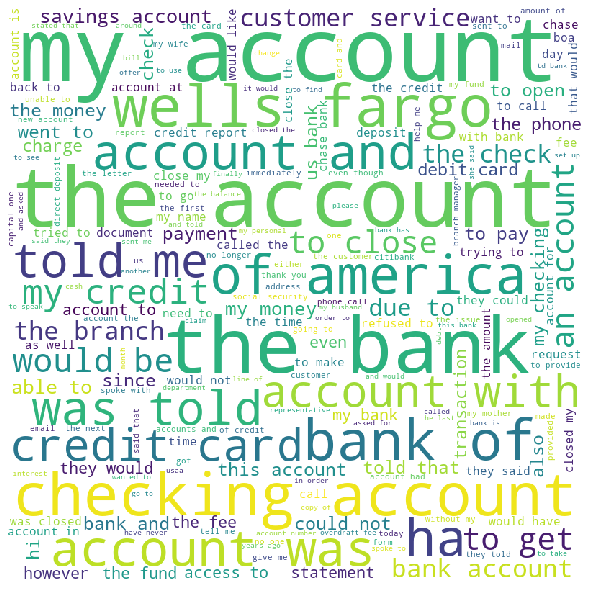

Cluster number: 28
i signed up for the american express card with a bonus of membership rewards points after meeting the minimum spend i met the minimum spend and was given the points three months later amex took the points back when i called i was told it was due to returned products there were never any returned products the csr agreed with me and told me they would open a case and i would hear back within business days i never heard back 

i was first solicited by phone i paid a deposit for a business opportunity i was supposed to receive including but not limited to the following marketing services page setup fill out available fields custom url news feed builder like industry or niche leaders install badge onto clients website discovery report competitor industry analysis research clients business model offering identify targeted customer audience demographic behaviors and interests develop final discovery report detailing finding strategy report i was never given the product as d

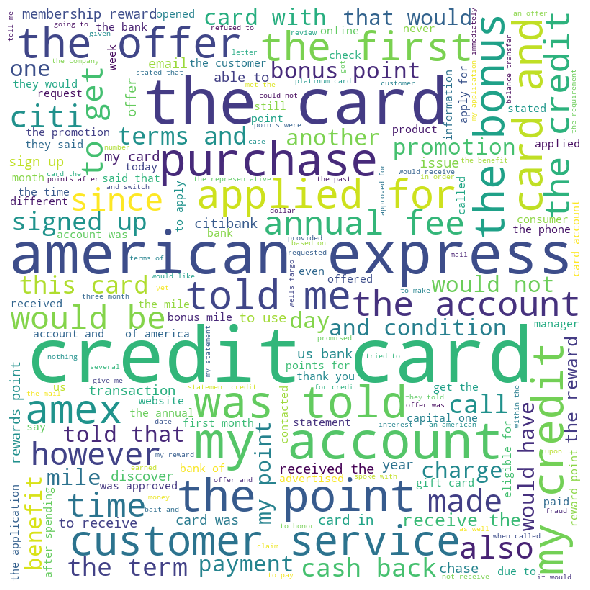

Cluster number: 29
i had a capitalone auto loan back in during some rough personal issues i had to make several payments late however after i recovered loan was closed and satisfied in capital one has been reporting to all credit bureaus the history of my payments i have reached out to them several times as well as disputed with the credit bureas capital one states they can report my history up to yrs and ill not remove i need help this has hurt my credit report for yrs i pay my bills on time because they wont remove my credit score is down points and shows i have more than car loan please help

my loan was with honda financial services my car was totaled after only months it was a new car with about miles paid off most of the loan i had gap insurance as well honda dealership processed my paperwork for the gap loan and faxed all documents to the gap loan insurance company honda kept harassing me for the remainder of the payment after they received most of the money from and all warrant

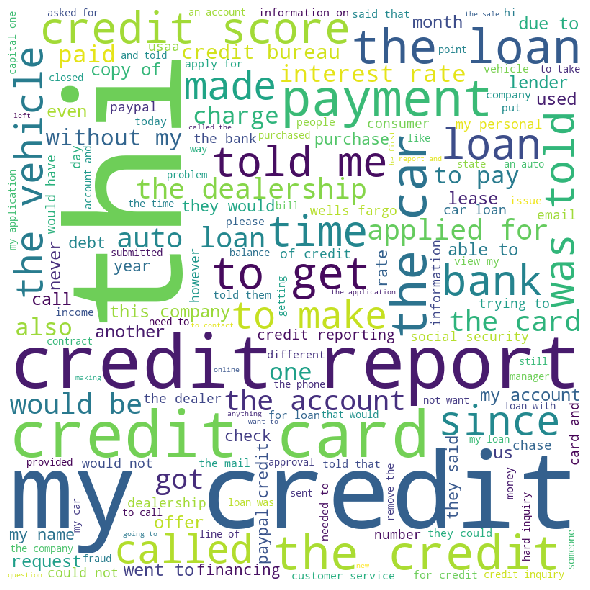

Cluster number: 30
Number of entries: 474


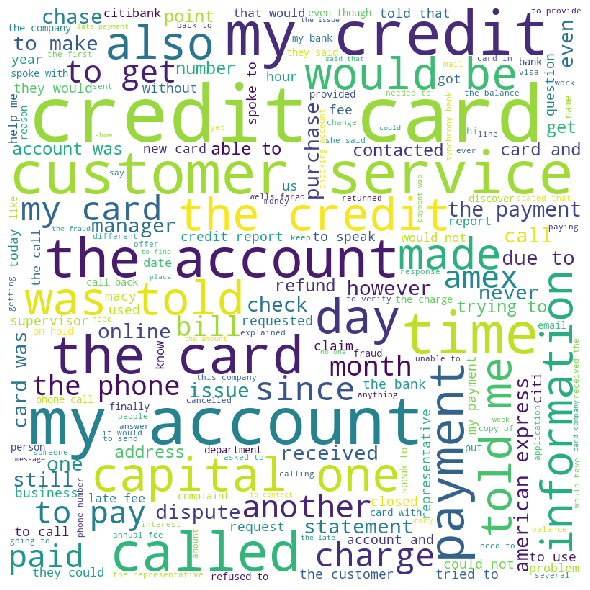

Cluster number: 31
 from oracle group contacted my place of employment saying him and a friend would come and arrest me and if i didnt go willingly then the would take me down with excessive force then proceeded to insult me saying i dont have interigrity and my mother should not have a son like me and he was going to keep calling my job untl he got me fired because a person like me doesnt deserve a job

Number of entries: 824


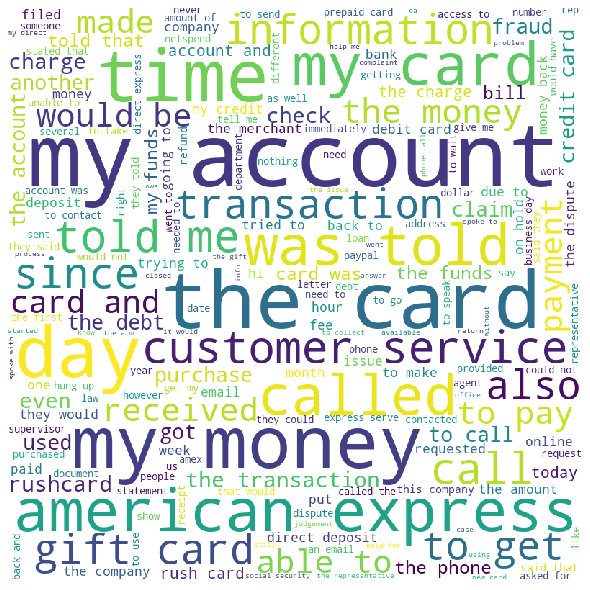

Cluster number: 32
Number of entries: 724


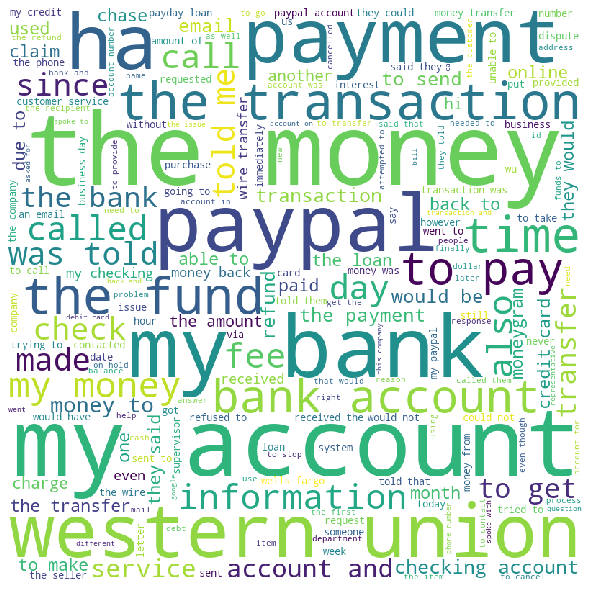

Cluster number: 33
first let me state that i never wanted this prepaid card i apparently had a credit at my doctor s office and that doctor s practice apparently had a deal with bofa to provide refunds by issuing a prepaid card the card came out of the unactivated for a long time because i really had no idea what it was even the emailed statements they must have gotten my email through the doctor s office looked like spam labeled consumer refunds and pmts with no mention of either the bank or the doctors that s not a link i would click on as it looked like phishing i did finally figure out it was linked to the doctor and activated the card to pay a co pay but there have been issues using the card so i called to try to cancel it and get the balance back on the first call the agent put me on hold for a while the told me she was transferring me to management instead i was disconnected i called back and the agent was somewhat more helpful she also put me on hold for a while but did come ba

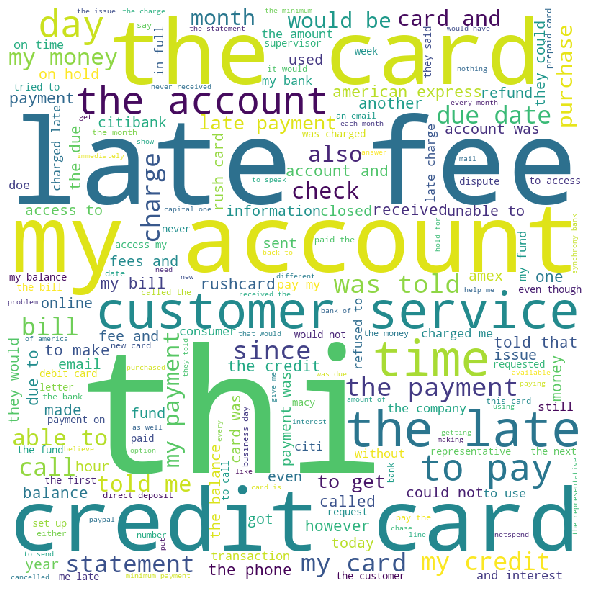

Cluster number: 34
Number of entries: 624


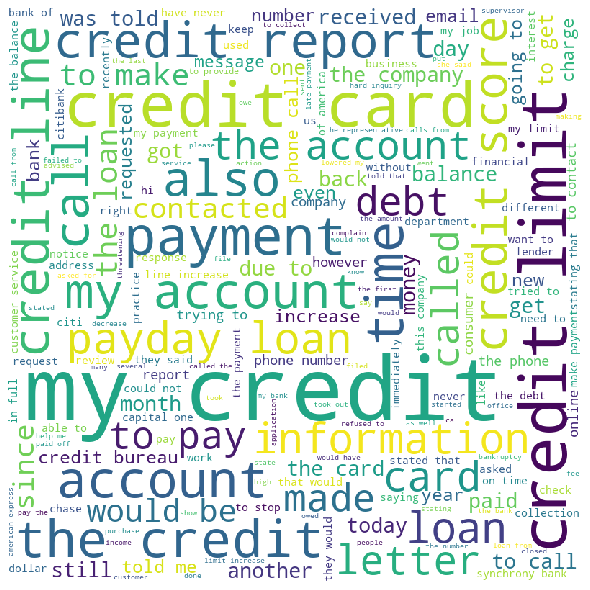

Cluster number: 35
to whom it may concern my name is i am a veteran with an i am writing to formally make a complaint agains chase credit card services for pulling my credit and not approving me on the initial applications due to a human negligence of chase behave and for pulling my credit for a second time without my consent and approving a credit card that i never applied for i summited a credit card application for a chase sapphire visa signature credit card on reference number on i received on the mail the letter from the chase department with a day time window to contact them back the issue is that the letter was writinggenerated on and sent out on making it impossible for me to respond on time as the letter was never physically sent on time by chase a clear negligence responsibility on behave of chase i have been calling the number to ask chase to correct their mistake and take into accountability their human error and therefore the initial application for the chase sapphire visa

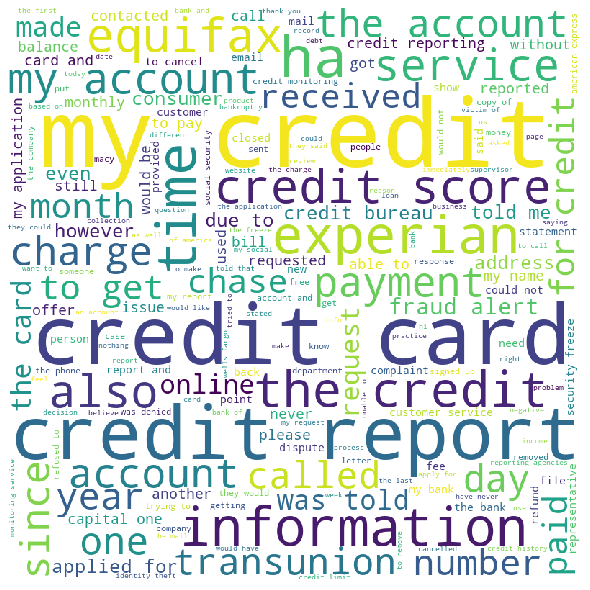

Cluster number: 36
Number of entries: 364


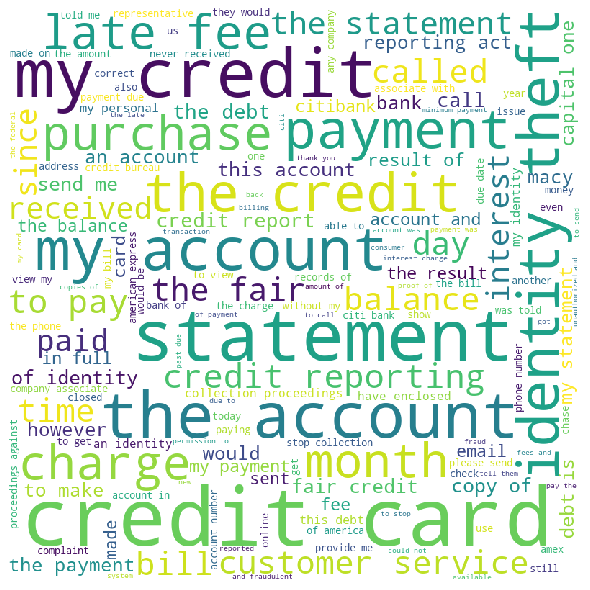

Cluster number: 37
Number of entries: 713


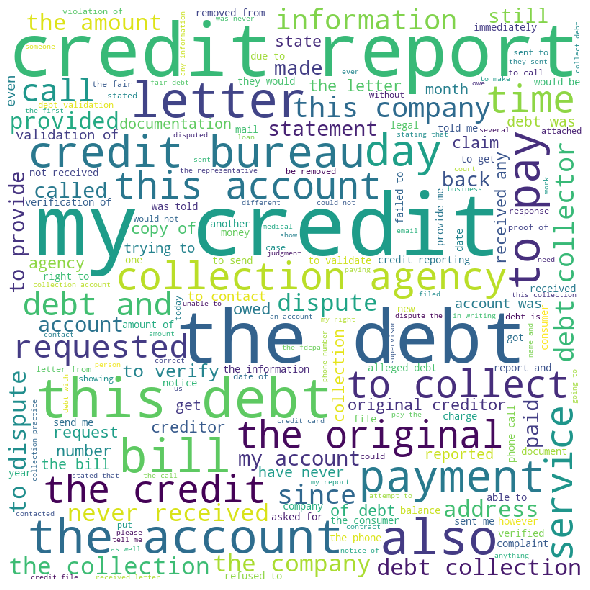

In [14]:
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
import random

#if it's your first time running with these stopwords, run the following line aswell:
#nltk.download('stopwords')

stopwords = set(stopwords.words('english'))
stopwords.add('xx')
stopwords.add('wa')

for i in range(0,number_clusters):
    all_words = ''
    print('Cluster number: '+str(i))
    amount = 0
    for index, row in df_result.iterrows():
        if row[0] == i:
            all_words += ' ' + row['Consumer complaint narrative']
            rand = random.randint(1,1000)
            amount += 1
            if(rand == 1):
                print(row['Consumer complaint narrative'] + '\n')
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(all_words) 
    print('Number of entries: ' + str(amount))
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show() 


## Visualizing clusters

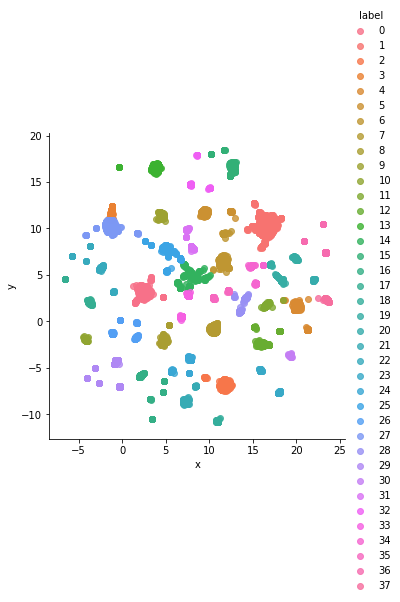

In [15]:
import seaborn as sns
_labels = pd.DataFrame(indexes)
labels = _labels.rename(columns={0: 'label'}) 

_reduced = pd.DataFrame(data_reduced)
reduced = _reduced.rename(columns={0: 'x', 1: 'y'}) 

clusters = pd.concat([reduced, labels], axis = 1)


facet = sns.lmplot(data=clusters, x='x', y='y', hue='label', 
                   fit_reg=False, legend=True, legend_out=True)
